In [2]:
## Ues For intal Processor 
# !pip install -r requirements.txt
## Use requirements_silicon.txt for silicon Processor (M1,M2,M3 ,ect..)
# !pip install -r requirements_silicon.txt

In [ ]:
import os
import numpy as np
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from PIL import Image
from collections import Counter
import tensorflow as tf
from tensorflow.keras import layers, Model,models
from tensorflow.keras.losses import CategoricalCrossentropy
from tensorflow.keras.models import load_model
# from tensorflow.keras.metrics import Metric, MeanIoU
from collections import Counter
import rasterio
import albumentations as A
from tensorflow.keras.applications import ResNet50

---

## 🗂 Supporting Utilities

### `load_paths(file_path)`
Loads paths from a file, one per line.

---

In [4]:
# ----------------------- DATA UTILITY FUNCTIONS ----------------------- #

def load_paths(file_path):
    """Load paths from a text file and return as a list."""
    with open(file_path, "r") as f:
        # print(f"Processing: {[os.path.abspath(line.strip()) for line in f.readlines()]}")
        return [os.path.abspath(line.strip()) for line in f.readlines()]


## 🎨 Class and Color Mappings

Supports full and merged class mappings via dictionaries:
- `class_mapping`, `color_mapping`
- `class_mapping_merged`, `color_mapping_merged`
- `merge_map` — for reducing number of classes

---

In [102]:


# ---------------------- CLASS MAPPINGS ---------------------- #
class_mapping = {
    1: 'Marine Debris',
    2: 'Dense Sargassum',
    3: 'Sparse Sargassum',
    4: 'Natural Organic Material',
    5: 'Ship',
    6: 'Clouds',
    7: 'Marine Water',
    8: 'Sediment-Laden Water',
    9: 'Foam',
    10: 'Turbid Water',
    11: 'Shallow Water',
    12: 'Waves',
    13: 'Cloud Shadows',
    14: 'Wakes',
    15: 'Mixed Water',
    0:'Unknown Class'
}
color_mapping = {
    1: (255, 0, 0),      # Marine Debris - Red
    2: (0, 128, 0),      # Dense Sargassum - Green
    3: (255, 255, 224),  # Foam - Light Yellow 
    4: (139, 69, 19),    # Natural Organic Material - Brown
    5: (128, 128, 128),  # Ship - Gray (Neutral and clear)
    6: (255, 255, 255),  # Clouds - White
    7: (0, 0, 255),      # Marine Water - Blue
    8: (210, 180, 140),  # Sediment-Laden Water - Tan
    9: (144, 238, 144),  # Sparse Sargassum - Light Green
    10: (64, 224, 208),  # Turbid Water - Turquoise
    11: (176, 224, 230), # Shallow Water - Powder Blue
    12: (0, 191, 255),   # Waves - Deep Sky Blue
    13: (105, 105, 105), # Cloud Shadows - Dim Gray
    14: (220, 220, 220), # Wakes - Gainsboro
    15: (70, 130, 180) , # Mixed Water - Steel Blue
    0: (211, 211, 211)  # Unknown background - Light Gray (Soft, neutral tone for unknown areas)
}

confidence_mapping = {
    1: 'High',
    2: 'Moderate',
    3: 'Low',
    0:'background',
}

# Mapping from original class IDs to new merged class IDs
merge_map = {
    0: 0,   # Unknown
    1: 1,   # Marine Debris
    2: 2,   # Sargassum
    3: 2,   # Sargassum
    4: 3,   # Organic Material
    5: 4,   # Ship
    6: 5,   # Clouds
    7: 6,   # Water
    8: 7,   # Sediment-laden water
    9: 3,   # Foam → Organic
    10: 6,  # Turbid water → Water
    11: 6,  # Shallow water → Water
    12: 6,  # Waves → Water
    13: 5,  # Cloud Shadows → Clouds
    14: 6,  # Wakes → Water
    15: 6   # Mixed Water → Water
}

class_mapping_merged = {
    0: "Unknown",
    1: "Marine Debris",
    2: "Sargassum",
    3: "Organic Material",
    4: "Ship",
    5: "Clouds",
    6: "Water",
    7: "Sediment-laden Water"
}

color_mapping_merged = {
    0: (211, 211, 211),  # Light gray
    1: (255, 0, 0),      # Red
    2: (0, 128, 0),      # Green
    3: (160, 82, 45),    # SaddleBrown (Organic)
    4: (128, 128, 128),  # Gray
    5: (255, 255, 255),  # White
    6: (0, 0, 255),      # Blue
    7: (210, 180, 140)   # Tan
}

# Utility Functions & Visualizer 

## 🧮 Utility Functions

### `find_unique_in_raw_masks(mask_paths)`
Returns the sorted set of unique class values across a list of raw mask image files.

**Parameters:**
- `mask_paths` (list of str): List of paths to mask images.

**Returns:**
- List of sorted unique class indices.

---

### `apply_uncertainty_class(mask, conf, threshold=1)`
Applies a specific class ID (e.g., 16) to pixels with confidence below a threshold.

**Parameters:**
- `mask` (np.ndarray): The segmentation mask.
- `conf` (np.ndarray): The confidence map.
- `threshold` (int): Pixels below this threshold are set to class 16.

**Returns:**
- Updated `mask` with uncertain areas labeled.

---

### `plot_mask_class_histogram(...)`
Displays a histogram of class frequency in masks using the provided class and color mappings.

**Parameters:**
- `mask_paths` or `dataset`: List of mask file paths or tf.data.Dataset object.
- `class_mapping` (dict): Mapping from class index to label.
- `color_mapping` (dict): Mapping from class index to RGB values.
- `title` (str): Title for the plot.
- `use_merged_labels` (bool): If True, merges class indices using `merge_map`.
- `merge_map` (dict): Class ID remapping for merged categories.

---

In [105]:

def find_unique_in_raw_masks(mask_paths):
    """
    Finds and returns the sorted set of unique class values across a list of mask files.

    Parameters:
    -----------
    mask_paths : list of str
        Paths to raw mask image files.

    Returns:
    --------
    list of int
        Sorted list of unique class values found across all masks.
    """
    all_classes = set()
    
    for path in mask_paths:
        mask = np.array(Image.open(path))  # or rasterio if needed
        unique = np.unique(mask)
        all_classes.update(unique.tolist())
    return sorted(all_classes)

      
def apply_uncertainty_class(mask, conf, threshold=1):
    """
    Apply an 'uncertain' label (e.g., class 16) to areas in the mask with low confidence.

    Parameters:
    -----------
    mask : np.ndarray
        The segmentation mask.
    conf : np.ndarray
        The corresponding confidence map.
    threshold : int
        Pixels with confidence below this threshold will be labeled as 16.

    Returns:
    --------
    mask : np.ndarray
        Updated mask with uncertain areas marked as class 16.
    """
    uncertain_mask = (conf < threshold)
    mask[uncertain_mask] = 16
    return mask


def plot_mask_class_histogram(mask_paths, class_mapping, color_mapping, title="Mask Class Distribution",use_merged_labels=False, merge_map=None):
    """
    Load a list of mask paths, count class frequencies, and display a color-coded histogram.

    Parameters:
    -----------
    mask_paths : list of str
        List of file paths to mask images.
    class_mapping : dict
        Mapping from class indices to class names.
    color_mapping : dict
        Mapping from class indices to RGB color codes.
    title : str
        Title for the plot.
    """
    class_counts = Counter()

    for path in mask_paths:
        with rasterio.open(path) as src:
            mask = src.read(1).astype(np.uint8)
        
            if use_merged_labels:
                mask = np.copy(mask)
                for old_id, new_id in merge_map.items():
                    mask[mask == old_id] = new_id
        
            unique, counts = np.unique(mask, return_counts=True)
            class_counts.update(dict(zip(unique, counts)))

    # Prepare data for plotting
    sorted_classes = sorted(class_counts.keys())
    labels = [class_mapping.get(c, f"Class {c}") for c in sorted_classes]
    values = [class_counts[c] for c in sorted_classes]
    colors = [np.array(color_mapping.get(c, (128, 128, 128))) / 255.0 for c in sorted_classes]

    # Plot
    plt.figure(figsize=(14, 6))
    bars = plt.bar(range(len(values)), values, color=colors)

    plt.xticks(ticks=range(len(labels)), labels=labels, rotation=45, ha='right')
    plt.ylabel("Pixel Count")
    plt.title(title)
    plt.grid(axis='y', linestyle='--', alpha=0.6)

    # Add counts above bars
    for bar, count in zip(bars, values):
        plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), f"{count:,}", 
                 ha='center', va='bottom', fontsize=8, rotation=90)

    plt.tight_layout()
    plt.show()


find unique mask classes in train_masks : [0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 12.0, 13.0, 14.0, 15.0]
find unique mask classes in val_masks : [0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 12.0, 13.0, 14.0, 15.0]
find unique mask classes in test_masks : [0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 12.0, 13.0, 14.0, 15.0]


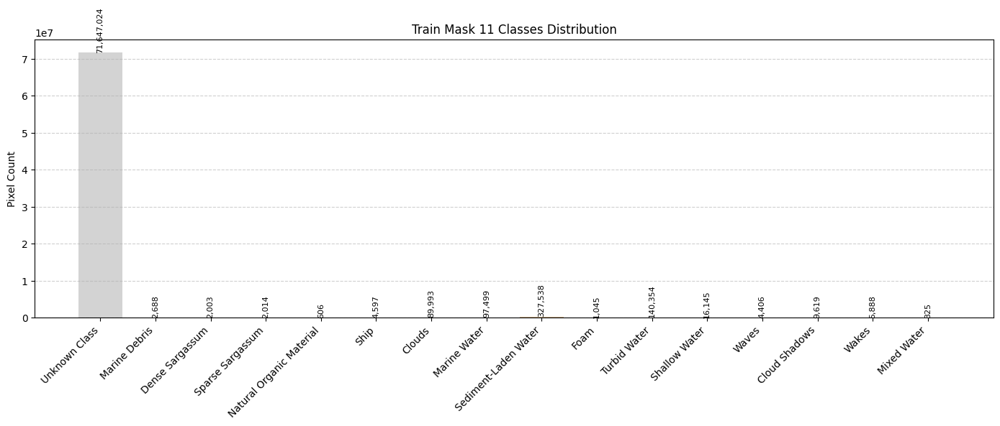

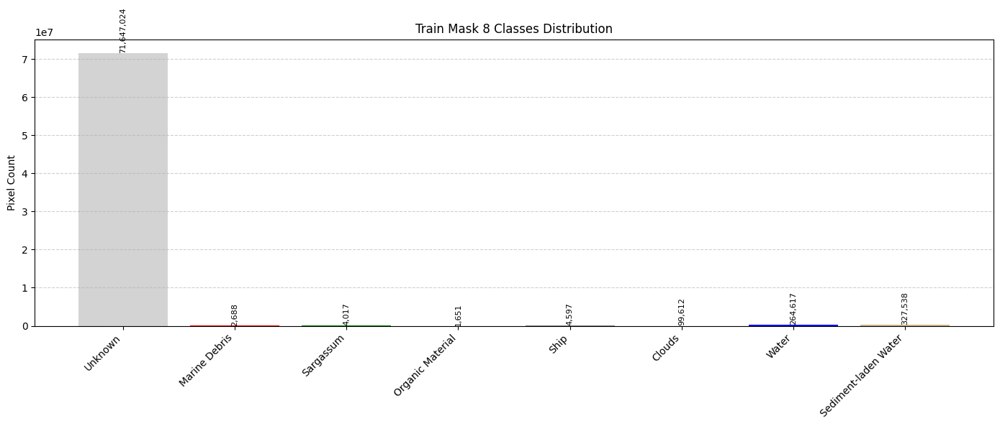

In [106]:

path_list={'train_masks':"../data/splits/train_masks.txt",
           'val_masks':"../data/splits/val_masks.txt",
           'test_masks':"../data/splits/test_masks.txt",
           }
for key, txt in path_list.items():
    path=load_paths(txt)
    print(f'find unique mask classes in {key} : {find_unique_in_raw_masks(path)}')
    
  

train_mask_paths = load_paths(path_list["train_masks"])
plot_mask_class_histogram(train_mask_paths, class_mapping, color_mapping, title="Train Mask 11 Classes Distribution")
plot_mask_class_histogram(train_mask_paths, class_mapping_merged, color_mapping_merged, title="Train Mask 8 Classes Distribution",use_merged_labels=True, merge_map=merge_map)

# DataPipeline Class Documentation

This module implements a comprehensive image preprocessing pipeline tailored for satellite imagery used in semantic segmentation tasks. The core functionality is encapsulated in the `DataPipeline` class.

---

## 📦 Class: `DataPipeline`

A preprocessing class for satellite images supporting augmentation, normalization, band manipulation, and label mapping for segmentation tasks.

### **Initialization Parameters**

- **`img_size`** (`tuple`): Target size (height, width) of the image after resizing.
- **`num_bands`** (`int`): Number of channels (e.g., spectral bands + indices).
- **`num_classes`** (`int`): Total number of segmentation classes.
- **`rare_classes`** (`list[int]`): Optional. List of rare class indices.
- **`normalization_method`** (`str`): Normalization method: `'percentile'`, `'robust'`, or `'minmax'`.
- **`use_merged_labels`** (`bool`): Whether to use a simplified class mapping.
- **`merge_map`** (`dict`): Optional. Mapping of original class labels to merged labels.

---

## 🔧 Methods

### `normalize_band(band)`
Normalize a single band using the configured method.

### `load_image(image_path)`
Loads a multi-band image from a GeoTIFF file and computes additional indices like NDVI, NDWI, etc.

### `load_mask(mask_path)`
Loads the mask and optionally maps it using `merge_map`.

### `load_confidence(conf_path)`
Loads confidence maps for auxiliary use (e.g., filtering or quality control).

### `has_rare_class(mask)`
Checks if a mask contains any rare classes.

### `apply_augmentation(image, mask)`
Applies random augmentations using the Albumentations library.

### `preprocess_pair(image_path, mask_path, augment=False, augment_rare_only=False)`
Full preprocessing pipeline for a single image-mask pair: normalization, augmentation (optional), and one-hot encoding of the mask.

### `get_tf_dataset(image_paths, mask_paths, batch_size, augment=False, augment_rare_only=False)`
Converts file paths into a TensorFlow dataset object. Handles batching, shuffling, and data loading.

### `summarize_dataset(dataset)`
Prints a summary of the class distributions within the given dataset.

---

## 🗂 Supporting Utilities

### `load_paths(file_path)`
Loads paths from a file, one per line.

---

## 🎨 Class and Color Mappings

Supports full and merged class mappings via dictionaries:
- `class_mapping`, `color_mapping`
- `class_mapping_merged`, `color_mapping_merged`
- `merge_map` — for reducing number of classes

---

## 🧪 Example Usage

```python
pipeline = DataPipeline(
    img_size=(256, 256),
    num_bands=9,
    num_classes=8,
    rare_classes=[1, 2, 3, 4, 5, 6, 7],
    normalization_method='minmax',
    use_merged_labels=True,
    merge_map=merge_map
)

train_dataset = pipeline.get_tf_dataset(train_imgs, train_masks, batch_size=32, augment=True, augment_rare_only=True)
pipeline.summarize_dataset(train_dataset)
```

---

## 🧾 Notes

- Mask one-hot encoding uses `np.eye(num_classes)[mask]`.
- NDVI, NDWI, FDI, and PFDI are used as spectral indices.
- Augmentation pipeline includes flips, rotations, brightness, contrast, and noise.
- The pipeline supports both full and merged class structures.

---

## ✅ Validation

A single batch can be previewed using:

```python
for img, mask in train_dataset.take(1):
    print("Image shape:", img.shape)
    print("Mask shape:", mask.shape)
```

# DataPipeline

In [110]:
# ---------------------- DATA PIPELINE ---------------------- #

class DataPipeline:
    """
    A preprocessing pipeline for satellite image data, including augmentation and band normalization.

    Parameters:
    -----------
    img_size : tuple
        Target size (height, width) for input images.
    num_classes : int
        Number of classes for the segmentation/masking task.
    rare_classes : list or None
        List of class indices that are considered rare (optional).
    normalization_method : str
        Normalization strategy to apply on each band. Options:
            - 'percentile': Scales data between 0–1 using the 2nd and 98th percentiles.
            - 'robust': Normalizes using median and IQR, then clips to [-1, 1].
            - 'minmax': Normalizes using exact min and max values per band.
    """

    def __init__(self, img_size,num_bands, num_classes, rare_classes=None, normalization_method='robust',use_merged_labels=False, merge_map=None):
        self.img_size = img_size
        self.num_bands=num_bands
        self.num_classes = num_classes
        self.rare_classes = rare_classes
        self.normalization_method = normalization_method
        self.use_merged_labels = use_merged_labels
        self.merge_map = merge_map or {}

         
        # Define common augmentations using Albumentations 
        self.augmentation_pipeline = A.Compose([
            A.HorizontalFlip(p=0.5),
            A.VerticalFlip(p=0.5),
            A.RandomRotate90(p=0.5),
            A.RandomBrightnessContrast(p=0.3),
            A.RandomGamma(p=0.3),
            A.GaussNoise(p=0.2),
        ], additional_targets={'mask': 'mask'})
    
    def normalize_band(self, band):
        """
        Normalize a single image band using the configured method.
        - 'percentile'
        - 'robust'
        - 'minmax'
        
        Parameters:
        -----------
        band : np.ndarray
            A single spectral band (2D array).

        Returns:
        --------
        normalized_band : np.ndarray
            The normalized band.
        """
        if self.normalization_method == 'percentile':
            min_val, max_val = np.percentile(band, (2, 98))
            normalized_band = np.clip((band - min_val) / (max_val - min_val + 1e-6), 0, 1)

        elif self.normalization_method == 'robust':
            median = np.median(band)
            q1, q3 = np.percentile(band, [25, 75])
            iqr = q3 - q1
            normalized_band = (band - median) / (iqr + 1e-6)
            normalized_band = np.clip(normalized_band, -1, 1)

        elif self.normalization_method == 'minmax':
            min_val, max_val = np.min(band), np.max(band)
            normalized_band = (band - min_val) / (max_val - min_val + 1e-6)

        else:
            raise ValueError("Unsupported normalization method. Choose 'percentile', 'robust', or 'minmax'.")

        return normalized_band.astype(np.float32)

    def load_image(self, image_path):
        """
        Load and normalize multiple bands and compute vegetation/water indices.

        Parameters:
        -----------
        image_path : str
            Path to the satellite image file.

        Returns:
        --------
        image : np.ndarray
            Multi-band image of shape (H, W, 9).
        """
        with rasterio.open(image_path) as src:
            blue = self.normalize_band(src.read(2))
            green = self.normalize_band(src.read(3))
            red = self.normalize_band(src.read(4))
            nir = self.normalize_band(src.read(8))
            swir1 = self.normalize_band(src.read(11))
            
             # Calculate selected indices
            ndvi = self.normalize_band((nir - red) / (nir + red + 1e-6))
            ndwi = self.normalize_band((green - swir1) / (green + swir1 + 1e-6))
            fdi = self.normalize_band(nir / (red + swir1 + 1e-6))
            pfdi = self.normalize_band((swir1 - nir) / (swir1 + nir + red + 1e-6))
            
            # Stack bands and indices into one image
            image=np.stack([red, green, blue,nir,swir1,ndvi,ndwi,fdi,pfdi], axis=-1)
            # image=np.stack([blue,nir,swir1], axis=-1)
            if self.num_bands != image.shape[2] :
                print(f'The number of the banes images({image.shape[2]}) not Matchthe number of the channel input({self.num_bands})')
                
        return image.astype(np.float32)
            


    def load_mask(self, mask_path):
        """
        Load and remap a raw mask to a fixed label range [0, 14], background = 15.

        Parameters:
        -----------
        mask_path : str
            Path to mask file.

        Returns:
        --------
        processed_mask : np.ndarray
            Processed mask with shape (H, W), dtype uint8.
        """
        with rasterio.open(mask_path) as src:
            raw_mask = src.read(1).astype(np.uint8)
            # unique_classes = np.unique(raw_mask)
            # print("Unique classes in raw mask:", unique_classes)

        # processed_mask = np.where((raw_mask >= 1) & (raw_mask <= 15), raw_mask - 1, 15)    # background = 15
        # unique_processed_classes = np.unique(processed_mask)
        # print("Unique classes in processed mask:", unique_processed_classes)
        if self.use_merged_labels:
            remapped = np.copy(raw_mask)
            for old_id, new_id in self.merge_map.items():
                remapped[raw_mask == old_id] = new_id
            return remapped
        else:
            return raw_mask
    
    def load_confidence(self, conf_path):
        """
        Load and process confidence map for training masking or quality control.

        Parameters:
        -----------
        conf_path : str
            Path to confidence map.

        Returns:
        --------
        processed_mask : np.ndarray
            Confidence labels remapped similarly to masks.
        """
        with rasterio.open(conf_path) as src:
            conf = src.read(1).astype(np.uint8)
            # unique_classes_conf = np.unique(conf)
            # print("Unique classes in Conf:", unique_classes_conf)
            
            # processed_mask = np.where((conf >= 1) & (conf <= 3), conf - 1, 15)
            # unique_processed_classes = np.unique(processed_mask)
            # print("Unique classes in Conf_processed:", unique_processed_classes)
            
        return conf
    
    def has_rare_class(self, mask):
        """
        Check if the given mask contains any rare class IDs.

        Parameters:
        -----------
        mask : np.ndarray
            Ground truth mask.

        Returns:
        --------
        bool
            True if rare class is found, else False.
        """
        return self.rare_classes and np.any(np.isin(mask, self.rare_classes))


    def apply_augmentation(self, image, mask):
        """
        Apply random augmentations to image and mask.

        Parameters:
        -----------
        image : np.ndarray
        mask : np.ndarray

        Returns:
        --------
        tuple : (augmented_image, augmented_mask)
        """
        augmented = self.augmentation_pipeline(image=image, mask=mask)
        return augmented['image'], augmented['mask']
    
    
    def preprocess_pair(self, image_path, mask_path, augment=False, augment_rare_only=False):
        """
        Load, normalize, and (optionally) augment a single image-mask pair.

        Parameters:
        -----------
        image_path : str or bytes
        mask_path : str or bytes
        augment : bool
            Whether to apply augmentation.
        augment_rare_only : bool
            Apply augmentation only if rare class exists.

        Returns:
        --------
        image : np.ndarray
            Preprocessed image with 9 channels.
        mask_one_hot : np.ndarray
            One-hot encoded mask of shape (H, W, num_classes).
        """
        if isinstance(image_path, bytes): image_path = image_path.decode("utf-8")
        if isinstance(mask_path, bytes): mask_path = mask_path.decode("utf-8")
        
        image = self.load_image(image_path)
        mask = self.load_mask(mask_path)
        
        # unique_classes = np.unique(mask)
        # print("Unique values in mask:", unique_classes)

        if augment:
            if augment_rare_only:
                if not augment_rare_only or self.rare_classes and np.any(np.isin(mask, self.rare_classes)):
                    image, mask = self.apply_augmentation(image, mask)

        mask_one_hot = np.eye(self.num_classes, dtype=np.float32)[mask]
        # print("Mask shape after one-hot encoding:", mask_one_hot.shape)
        return image, mask_one_hot
    
    
    def get_tf_dataset(self, image_paths, mask_paths, batch_size, augment=False, augment_rare_only=False):
        """
        Create a TensorFlow dataset from image and mask paths.

        Parameters:
        -----------
        image_paths : list
        mask_paths : list
        batch_size : int
        augment : bool
        augment_rare_only : bool

        Returns:
        --------
        tf.data.Dataset
            A preprocessed, batched, and prefetched dataset.
        """
        dataset = tf.data.Dataset.from_tensor_slices((image_paths, mask_paths))

        def _load_data(img_path, mask_path):
            img, mask = tf.numpy_function(
                self.preprocess_pair,
                [img_path, mask_path, augment, augment_rare_only],
                [tf.float32, tf.float32]
            )
            img.set_shape((*self.img_size, self.num_bands))        # Corrected  9 bands
            mask.set_shape((*self.img_size, self.num_classes))   # One-hot encoded mask
            return img, mask

        return dataset.map(_load_data, num_parallel_calls=tf.data.AUTOTUNE)\
                      .batch(batch_size)\
                      .prefetch(tf.data.AUTOTUNE)


    def summarize_dataset(self, dataset):
        """
        Print dataset summary with class pixel distribution.

        Parameters:
        -----------
        dataset : tf.data.Dataset
            Dataset to summarize.
        """
        total_images = 0
        class_counts = np.zeros(self.num_classes)

        for imgs, masks in dataset:
            total_images += imgs.shape[0]
            masks = masks.numpy().argmax(-1)
            unique, counts = np.unique(masks, return_counts=True)
            class_counts[unique] += counts

        print(f"\n📊 Dataset Summary:")
        print(f"- Total images: {total_images}")
        for idx, count in enumerate(class_counts):
            print(f"  - Class {idx:2d}: {int(count)} pixels")
            

In [120]:

# ---------------------- CONFIGURATION ---------------------- #
IMG_SIZE = (256, 256)
NUM_BANDS=9
NUM_CLASSES = len(set(merge_map.values()))  # Use < class_mapping.values() >  for haveing 16 classes or  < merge_map.values() >  for haveing 8 classes
BATCH_SIZE = 32
EPOCHS = 120

# ----------------------- LOAD AND PREPROCESS DATA ----------------------- #

# Initialize pipeline
pipeline = DataPipeline(
    img_size=IMG_SIZE,
    num_bands=NUM_BANDS,
    num_classes=NUM_CLASSES, # Use < class_mapping.values() >  for haveing 16 classes or  < merge_map.values() >  for haveing XX classes
    rare_classes=[1, 2, 3, 4, 5, 6 ,7], # the maximum number should be the NUM_CLASSES-1
    normalization_method='minmax', # Normalize a single image band using the configured method - 'percentile' - 'robust' - 'minmax'
    use_merged_labels=True, # make this one True if you Would like to customize the classes number to be 8 And you should to pass the merge map Dictionary Otherwise, make false
    merge_map=merge_map  
    
)

# Load paths from your original split files
train_imgs = load_paths("../data/splits/train_X.txt")
train_masks = load_paths("../data/splits/train_masks.txt")
val_imgs = load_paths("../data/splits/val_X.txt")
val_masks = load_paths("../data/splits/val_masks.txt")
test_imgs = load_paths("../data/splits/test_X.txt")
test_masks = load_paths("../data/splits/test_masks.txt")

# Create datasets
train_dataset = pipeline.get_tf_dataset(
    train_imgs, train_masks, batch_size=32, augment=True, augment_rare_only=True
)
# Create datasets
val_dataset = pipeline.get_tf_dataset(
    val_imgs, val_masks, batch_size=32, augment=False
)
# Create datasets
test_dataset = pipeline.get_tf_dataset(
    test_imgs, test_masks, batch_size=32, augment=False
)

# Summarize dataset
pipeline.summarize_dataset(train_dataset)

# ----------------------- VALIDATE ONE BATCH ----------------------- #
for img, mask in train_dataset.take(1):
    print("✅ Image shape:", img.shape)
    print("✅ Mask shape:", mask.shape)
    print("✅ Mask unique values:", np.unique(mask.numpy().argmax(axis=-1)))




📊 Dataset Summary:
- Total images: 1104
  - Class  0: 71647024 pixels
  - Class  1: 2688 pixels
  - Class  2: 4017 pixels
  - Class  3: 1651 pixels
  - Class  4: 4597 pixels
  - Class  5: 99612 pixels
  - Class  6: 264617 pixels
  - Class  7: 327538 pixels
✅ Image shape: (32, 256, 256, 9)
✅ Mask shape: (32, 256, 256, 8)
✅ Mask unique values: [0 1 2 3 4 5 6 7]


---

### `compute_class_weights(dataset)`
Computes inverse-frequency class weights from a dataset.

**Parameters:**
- `dataset` (tf.data.Dataset): Dataset of image-mask pairs.

**Returns:**
- `np.ndarray`: Weight per class for imbalanced class handling.

---

In [121]:
# ----------------------- compute_class_weights ----------------------- #
def compute_class_weights(dataset):
    """Compute class weights based on pixel frequency in the dataset."""
    all_labels = []
    for _, mask in dataset:
        mask_np = mask.numpy().argmax(axis=-1).flatten()
        all_labels.extend(mask_np)
    class_counts = Counter(all_labels)
    # print(f"class_counts: {class_counts}")
    total_pixels = sum(class_counts.values())
    class_weights = {cls: total_pixels / (len(class_counts) * count) for cls, count in class_counts.items()}
    for i in range(NUM_CLASSES):
        if i not in class_weights:
            class_weights[i] = 1.0  # default weight
    return np.array([class_weights[i] for i in range(NUM_CLASSES)])


class_weights_array = compute_class_weights(train_dataset)


### `find_unique_classes(dataset)`
Finds all unique class labels present in a dataset.

**Parameters:**
- `dataset`: TensorFlow dataset.

**Returns:**
- Sorted list of unique class IDs.

---

### `check_class_distribution(dataset)`
Counts how frequently each class occurs across the dataset.

**Parameters:**
- `dataset`: TensorFlow dataset.

**Returns:**
- Array of class frequencies.

---

In [122]:
# ----------------------- ANALYSIS & VISUALIZATION  ----------------------- #

def find_unique_classes(dataset):
    """Find unique class indices in the mask labels."""
    unique_classes = set()
    for _, mask in dataset:
        mask_np = np.argmax(mask.numpy(), axis=-1)  # Convert one-hot to class indices
        unique_classes.update(np.unique(mask_np))
    return sorted(unique_classes)


    return np.array([class_weights[i] for i in range(NUM_CLASSES)])
    # return class_weights

def check_class_distribution(dataset):
    """Check class frequency across the dataset."""
    class_counts = np.zeros(NUM_CLASSES)
    for _, mask in dataset:
        mask_indices = np.argmax(mask.numpy(), axis=-1)
        for c in np.unique(mask_indices):
            class_counts[c] += 1
    return class_counts

Unique class values in training masks: [0, 1, 2, 3, 4, 5, 6, 7]
Class Weights:
 [1.26229500e-01 3.36457143e+03 2.25142345e+03 5.47787280e+03
 1.96736306e+03 9.07919528e+01 3.41775774e+01 2.76119656e+01]
  Unknown                   → Weight: 0.1262
  Marine Debris             → Weight: 3364.5714
  Sargassum                 → Weight: 2251.4235
  Organic Material          → Weight: 5477.8728
  Ship                      → Weight: 1967.3631
  Clouds                    → Weight: 90.7920
  Water                     → Weight: 34.1776
  Sediment-laden Water      → Weight: 27.6120


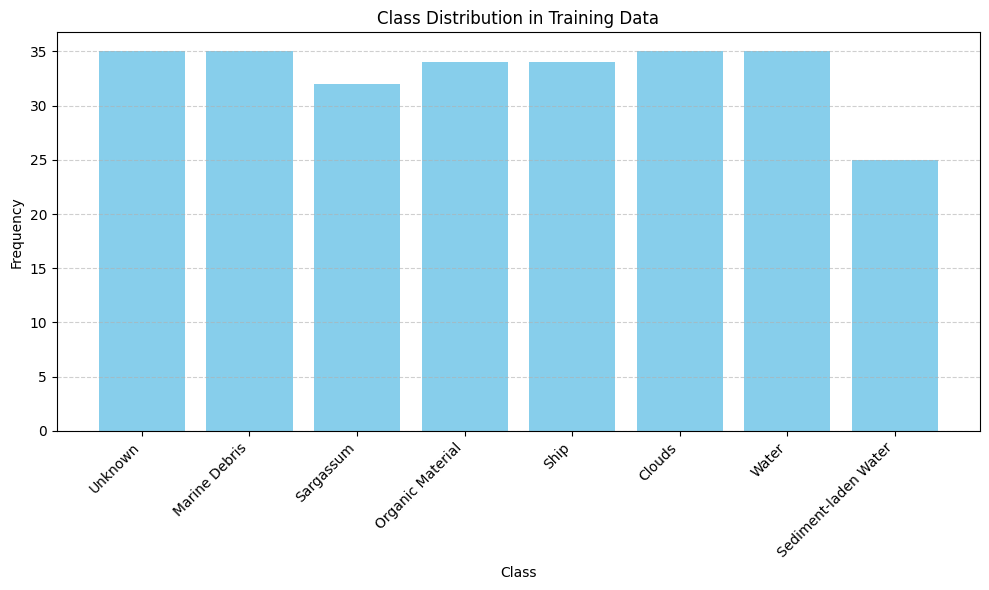

In [123]:
unique_classes = find_unique_classes(train_dataset)
print(f"Unique class values in training masks: {unique_classes}")
print("Class Weights:\n", class_weights_array)

for idx, weight in enumerate(class_weights_array):
    class_name = class_mapping_merged.get(idx, f"Class {idx}")
    print(f"  {class_name:25} → Weight: {weight:.4f}")

# 📈 Plot class distribution with class names on x-axis
distribution = check_class_distribution(train_dataset)
plt.figure(figsize=(10, 6))
plt.bar(range(NUM_CLASSES), distribution, color='skyblue')
plt.xlabel('Class')
plt.ylabel('Frequency')
plt.title('Class Distribution in Training Data')
plt.xticks(
    range(NUM_CLASSES),
    labels=[class_mapping_merged.get(i, f"Class {i}") for i in range(NUM_CLASSES)],
    rotation=45,
    ha='right'
)
plt.grid(True, axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


# Visualization Dataset(Image with Mask and confidence)

## 🖼️ Class: `Visualizer`

### Purpose:
To visualize the satellite image, segmentation mask, and confidence map for analysis.

### **Initialization Parameters**
- `pipeline` (`DataPipeline`): Instance for loading and processing data.
- `class_mapping` (`dict`): Mapping from class index to human-readable name.
- `color_mapping` (`dict`): Mapping from class index to RGB tuple.
- `confidence_mapping` (`dict`): Mapping from confidence index to description.

---

### `apply_color_mapping(array)`
Applies RGB coloring to a 2D label map using `color_mapping`.

---

### `visualize_sample(image_path, mask_path, conf_path=None, save_path=None)`
Visualizes a sample image, mask, and optional confidence map.

- Shows RGB composite
- Shows colored mask with legend
- Shows confidence with labels

---

### `process_and_visualize_samples(...)`
Processes multiple samples and visualizes them in batches.

**Parameters:**
- `image_file_path`, `mask_file_path`, `conf_file_path`: Paths to lists of image/mask/confidence files.
- `visualizer`: Instance of `Visualizer`.
- `num_images`: Number of samples to visualize.
- `save_dir`: Output directory for saving images.

---

## ✅ Example Use

```python
visualizer = Visualizer(pipeline, class_mapping, color_mapping, confidence_mapping)
process_and_visualize_samples(
    image_file_path="train_X.txt",
    mask_file_path="train_masks.txt",
    conf_file_path="train_confidence.txt",
    visualizer=visualizer,
    num_images=5
)
```

---

In [124]:
class Visualizer:
    """
    Visualizes satellite image data with masks and confidence maps.

    Parameters:
    -----------
    pipeline : DataPipeline
        Instance of the preprocessing pipeline to load and process data.
    class_mapping : dict
        Mapping from class IDs to human-readable class names.
    confidence_mapping : dict
        Mapping from confidence levels to descriptions.
    color_mapping : dict
        Mapping from class IDs to RGB color codes (0–255).
    """
    def __init__(self, pipeline, class_mapping,color_mapping, confidence_mapping):
        self.pipeline = pipeline
        self.class_mapping = class_mapping
        self.confidence_mapping = confidence_mapping
        self.color_mapping = color_mapping
        

    def apply_color_mapping(self, array):
        """
        Map a label array to a color-coded RGB image.

        Parameters:
        -----------
        array : np.ndarray
            2D array of class labels from the mask or confidence .

        Returns:
        --------
        rgb : np.ndarray
            RGB visualization of the label map.
        """
        h, w = array.shape
        rgb = np.zeros((h, w, 3), dtype=np.uint8)

        for val, color in self.color_mapping.items():
            rgb[array == val] = color

        return rgb

    def visualize_sample(self, image_path, mask_path, conf_path=None, save_path=None):
        """
        Load, process, and visualize a single satellite image, mask, and confidence map.

        Parameters:
        -----------
        image_path : str
            Path to the satellite image file.
        mask_path : str
            Path to the corresponding mask file.
        conf_path : str, optional
            Path to the confidence map file.
        save_path : str, optional
            If provided, save the visualization to this path.
        """
        # Load and normalize image through pipeline
        image = self.pipeline.load_image(image_path) # [red, green, blue,nir,swir1,ndvi,ndwi,fdi,pfdi]
        mask = self.pipeline.load_mask(mask_path)
        confidence = self.pipeline.load_confidence(conf_path) if conf_path else None
        
        print(f"Image shape: {image.shape}")
        print("Unique classes in Mask:", np.unique(mask))
        print("Unique classes in Confidence:", np.unique(confidence) if confidence is not None else "None")
       
        # Extract bands for visual composites
        n_s_b_image=image[...,[4,3,2]]                  # SWIR1, NIR, Blue
        rgb_image = image[:, :, :3]                     # Natural color
        rgb_mask = self.apply_color_mapping(mask)
        rgb_conf = self.apply_color_mapping(confidence) if confidence is not None else np.zeros_like(rgb_mask)


    # ---------------- Plot bands and indices ---------------- #     
        fig, axs = plt.subplots(2, 4, figsize=(22, 10))

        axs[0, 0].imshow(image[:, :, 0], cmap='Reds')
        axs[0, 0].set_title("Red Band")

        axs[0, 1].imshow(image[:, :, 1], cmap='Greens')
        axs[0, 1].set_title("Green Band")

        axs[0, 2].imshow(image[:, :, 2], cmap='Blues')
        axs[0, 2].set_title("Blue Band")

        axs[0, 3].imshow(image[:, :, 5], cmap='viridis')
        axs[0, 3].set_title("NDVI")

        axs[1, 0].imshow(image[:, :, 6], cmap='viridis')
        axs[1, 0].set_title("NDWI")

        axs[1, 1].imshow(image[:, :, 7], cmap='viridis')
        axs[1, 1].set_title("FDI")

        axs[1, 2].imshow(image[:, :, 8], cmap='viridis')
        axs[1, 2].set_title("PFDI")

        axs[1, 3].imshow(n_s_b_image)
        axs[1, 3].set_title("(NIR, SWIR1, Blue)")

        plt.tight_layout()
        plt.show()

         # ---------------- Plot RGB, Mask, Confidence ---------------- #
        fig, axs2 = plt.subplots(1, 3, figsize=(18, 5))
        
        axs2[0].imshow(rgb_image)
        axs2[0].set_title(f"RGB Image - {os.path.basename(image_path)}")
        axs2[0].axis("off")

        axs2[1].imshow(rgb_mask)
        axs2[1].set_title(f"Mask - {os.path.basename(image_path)}")
        axs2[1].axis("off")

        patches = [mpatches.Patch(color=np.array(color)/255, label=self.class_mapping[val])
                   for val, color in self.color_mapping.items() if val in np.unique(mask)]
        axs2[1].legend(handles=patches, loc='lower center', bbox_to_anchor=(0.5, -0.2), ncol=5)

        axs2[2].imshow(rgb_conf)
        axs2[2].set_title("Confidence Map")
        axs2[2].axis("off")
        
        patches = [mpatches.Patch(color=np.array(color)/255, label=self.confidence_mapping[val])
                   for val, color in self.color_mapping.items() if val in np.unique(confidence)]
        axs2[2].legend(handles=patches, loc='lower center', bbox_to_anchor=(0.5, -0.2), ncol=5)
        

        plt.tight_layout()
        plt.show()    

def process_and_visualize_samples(
    image_file_path, mask_file_path, conf_file_path,
    visualizer, num_images=3, save_dir="outputs"
):
    """
    Batch process and visualize multiple satellite image samples.

    Parameters:
    -----------
    image_file_path : str
        Path to text file listing image file paths (one per line).
    mask_file_path : str
        Path to text file listing mask file paths.
    conf_file_path : str
        Path to text file listing confidence map paths.
    visualizer : Visualizer
        Instance of the Visualizer class to handle display logic.
    num_images : int
        Number of samples to visualize.
    save_dir : str
        Directory where visualizations are saved (optional).
    """

    os.makedirs(save_dir, exist_ok=True)

    try:
        with open(image_file_path, "r") as img_f, \
             open(mask_file_path, "r") as msk_f, \
             open(conf_file_path, "r") as conf_f:

            for idx, (img_line, msk_line, conf_line) in enumerate(zip(img_f, msk_f, conf_f)):
                if idx >= num_images:
                    break

                img_path = img_line.strip()
                msk_path = msk_line.strip()
                conf_path = conf_line.strip()

                if not os.path.exists(msk_path) or not os.path.exists(conf_path):
                    print(f"⚠️ Skipping {img_path} due to missing mask or confidence.")
                    continue

                print(f"🔍 Visualizing sample {idx + 1}: {os.path.basename(img_path)}")

                save_path = os.path.join(save_dir, f"sample_{idx+1:02d}.png")
                visualizer.visualize_sample(
                    image_path=img_path,
                    mask_path=msk_path,
                    conf_path=conf_path  
                )

    except Exception as e:
        print(f"❌ Error during visualization: {e}")


🔍 Visualizing sample 1: S2_24-4-19_36JUN_7.tif
Image shape: (256, 256, 9)
Unique classes in Mask: [0 5]
Unique classes in Confidence: [0 1]


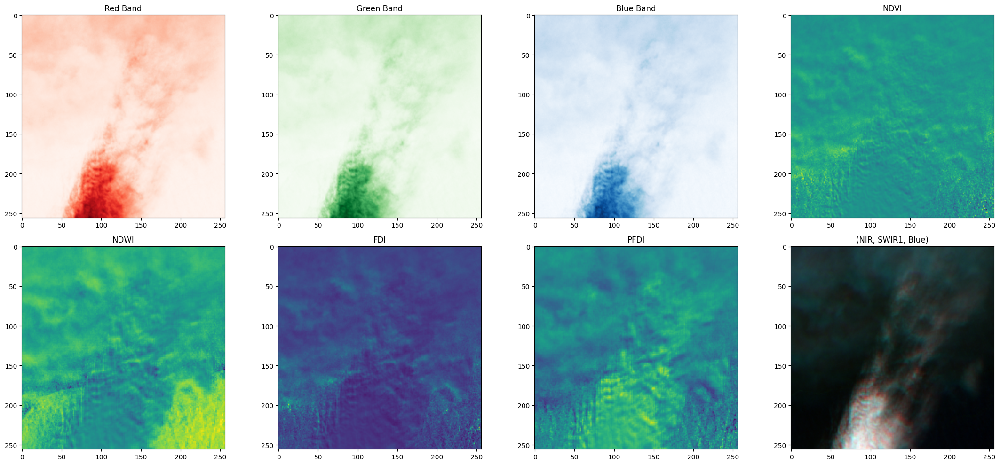

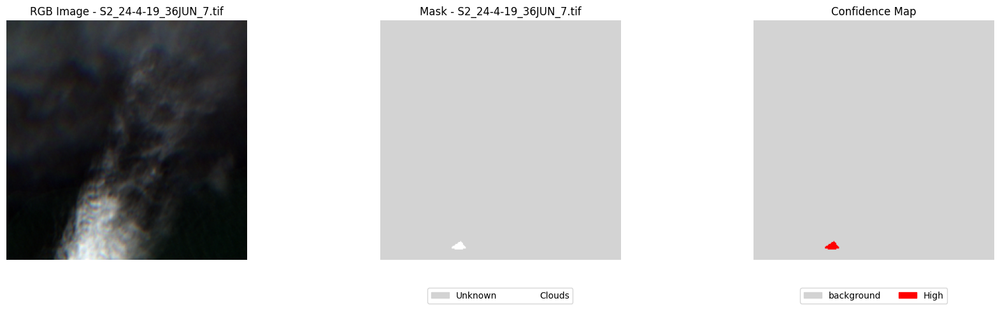

🔍 Visualizing sample 2: S2_7-10-18_52SDD_8.tif
Image shape: (256, 256, 9)
Unique classes in Mask: [0 3 6]
Unique classes in Confidence: [0 1 2 3]


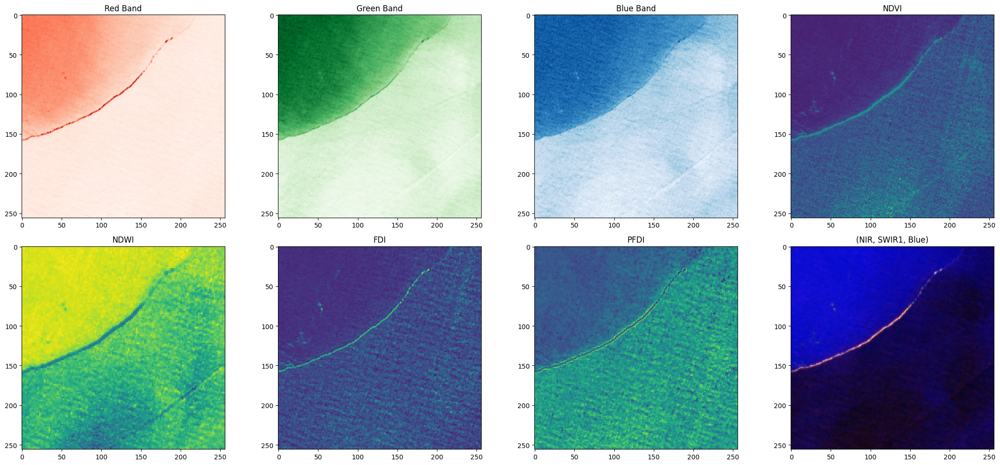

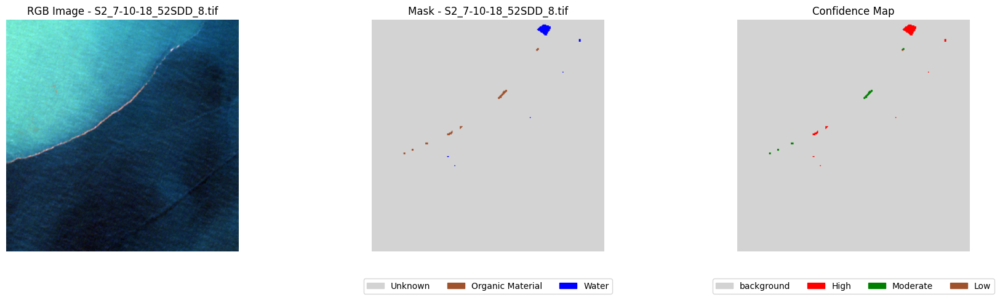

🔍 Visualizing sample 3: S2_9-10-17_16PEC_14.tif
Image shape: (256, 256, 9)
Unique classes in Mask: [0 5 6]
Unique classes in Confidence: [0 1]


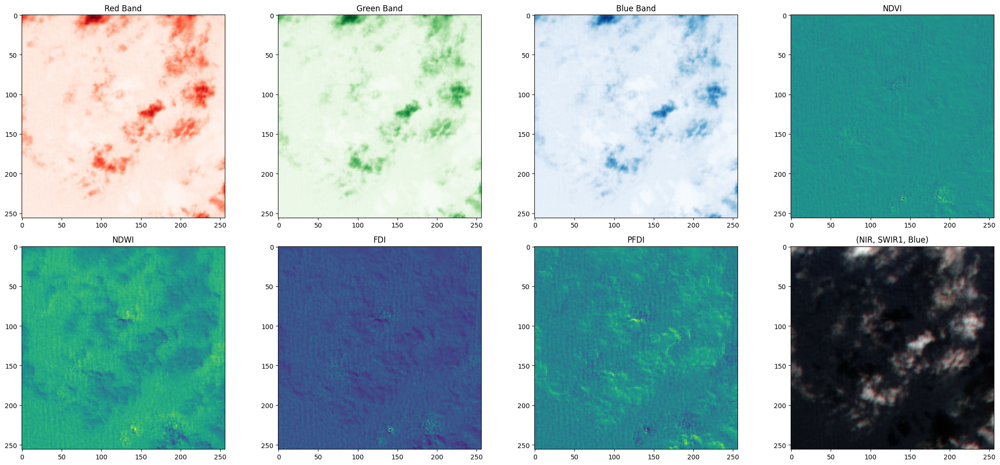

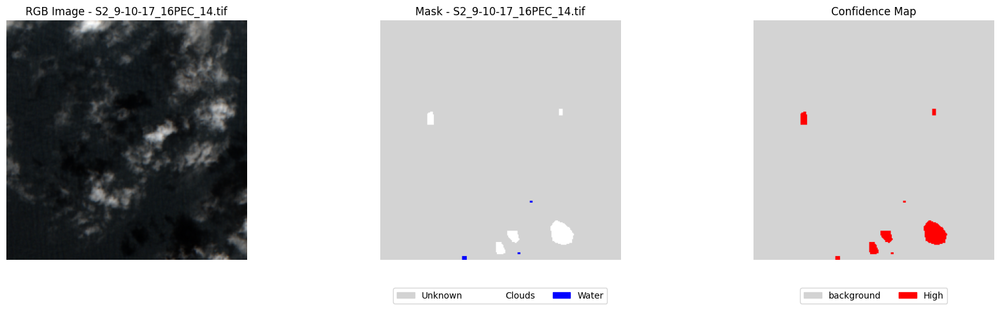

🔍 Visualizing sample 4: S2_4-9-19_16PCC_30.tif
Image shape: (256, 256, 9)
Unique classes in Mask: [0 5 6]
Unique classes in Confidence: [0 1]


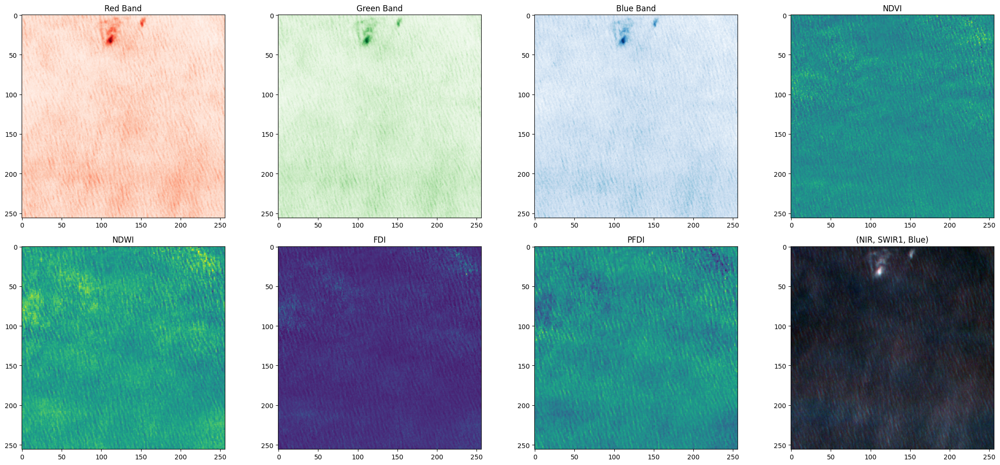

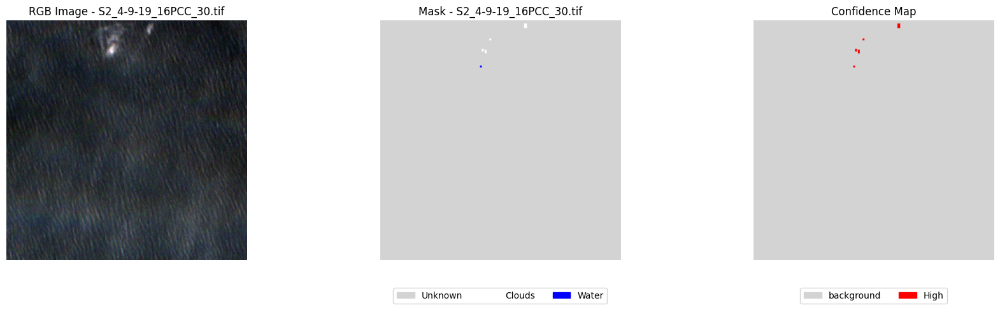

🔍 Visualizing sample 5: S2_18-9-20_16PCC_17.tif
Image shape: (256, 256, 9)
Unique classes in Mask: [0 1 6]
Unique classes in Confidence: [0 1 2 3]


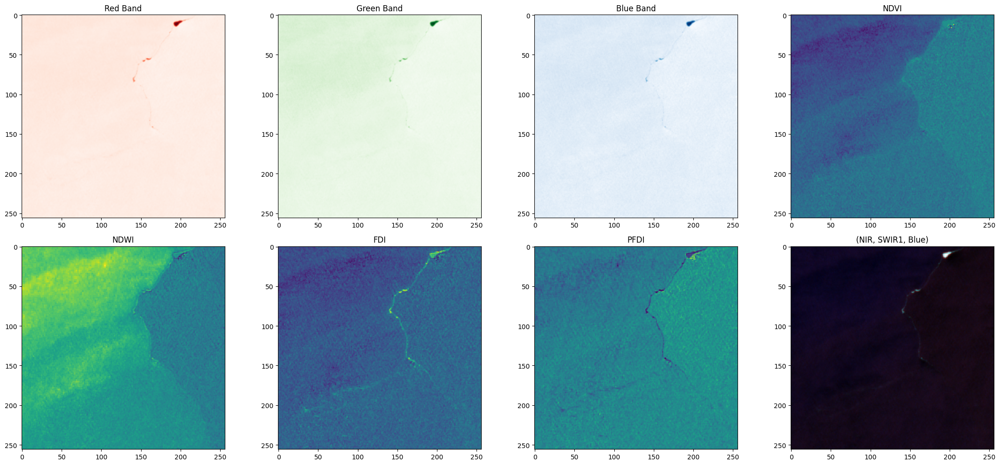

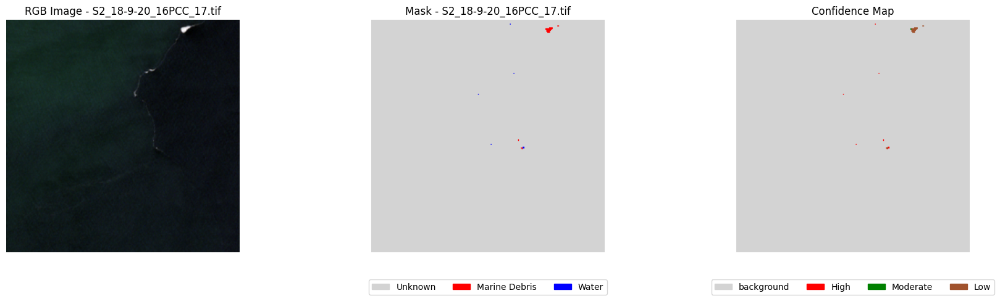

🔍 Visualizing sample 6: S2_13-12-18_16PCC_6.tif
Image shape: (256, 256, 9)
Unique classes in Mask: [0 6]
Unique classes in Confidence: [0 1]


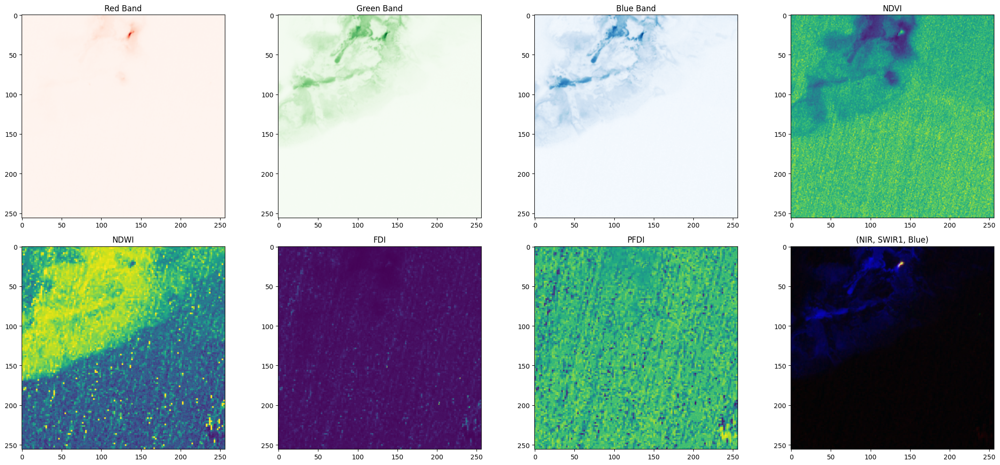

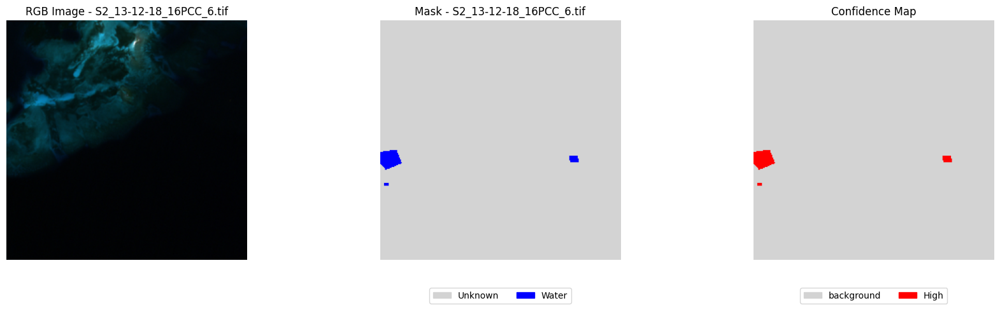

In [125]:
visualizer = Visualizer(pipeline, class_mapping_merged,color_mapping_merged, confidence_mapping ) # Use (class_mapping ,color_mapping) or (class_mapping_merged,color_mapping_merged)
process_and_visualize_samples(
    image_file_path="../data/splits/train_X.txt",
    mask_file_path="../data/splits/train_masks.txt",
    conf_file_path="../data/splits/train_confidence.txt",
    visualizer=visualizer,
    num_images=6,
    save_dir="visualized_outputs"
)

# Modeling Documentation for Segmentation Framework



This document describes the architecture, loss functions, metrics, and training utilities for semantic segmentation models used in marine debris and water body classification tasks.

---

## ⚙️ Loss Functions

### `multiclass_dice_loss(y_true, y_pred)`
- Dice loss for multi-class problems.
- Focuses on overlapping region between prediction and ground truth.

### `multiclass_focal_loss(gamma=2.0, alpha=0.25)`
- Focal loss to focus on hard-to-classify examples.
- `gamma` controls focus, `alpha` balances class weights.

### `combined_multiclass_loss(y_true, y_pred)`
- Weighted combination of dice and focal loss.

### `weighted_categorical_crossentropy_new(weights)`
- Custom cross-entropy loss with manual class weights.

### `weighted_focal_loss(weights, gamma=2.0)`
- Class-weighted variant of focal loss for unbalanced datasets.

---

## 📏 Metrics

### `multiclass_iou(y_true, y_pred)`
- Calculates intersection-over-union across all classes.

### `MulticlassF1Score(num_classes)`
- Custom TensorFlow metric for class-wise F1 scores.
- Maintains internal confusion matrix statistics.

---

## 🚀 Training Utilities

### `compile_and_train(model, train_dataset, val_dataset, save_path, epochs=50)`
- Compiles and trains a model.
- Supports different loss configurations.
- Uses `ModelCheckpoint`, `EarlyStopping`, and `ReduceLROnPlateau`.

### `evaluate_and_save(model, test_dataset, model_path)`
- Evaluates a trained model.
- Saves the final Keras model to disk.
- Prints IoU and F1 score.

---

## 🧪 Inference

### `predict_mask(model, image_tensor)`
- Accepts a single image and returns predicted segmentation mask.

---

## ✅ Example Usage

```python
# Create and train model
model = attention_unet(input_shape=(256, 256, 9), num_classes=8)
compile_and_train(model, train_dataset, val_dataset, save_path="model.h5", epochs=100)

# Evaluate
evaluate_and_save(model, test_dataset, model_path="model_final.keras")

# Predict on new image
predicted_mask = predict_mask(model, sample_image)
```

---

## 📝 Notes

- Both models are designed to work with 9-band satellite inputs.
- Loss functions are tailored for class imbalance (e.g. marine debris is rare).
- Evaluation focuses on mean IoU and mean F1-score for multi-class prediction.

In [ ]:

# --------------------------- Loss Functions --------------------------- #

def multiclass_dice_loss(y_true, y_pred, smooth=1e-5):
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.clip_by_value(y_pred, 1e-7, 1 - 1e-7)
    intersection = tf.reduce_sum(y_true * y_pred, axis=[1,2,3])
    union = tf.reduce_sum(y_true + y_pred, axis=[1,2,3])
    dice = (2. * intersection + smooth) / (union + smooth)
    return 1 - tf.reduce_mean(dice)

def multiclass_focal_loss(gamma=2.0, alpha=0.25):
    def loss(y_true, y_pred):
        y_true = tf.cast(y_true, tf.float32)
        y_pred = tf.clip_by_value(y_pred, 1e-7, 1 - 1e-7)
        ce = -y_true * tf.math.log(y_pred)
        weight = alpha * tf.pow(1 - y_pred, gamma)
        return tf.reduce_mean(weight * ce)
    return loss

def combined_multiclass_loss(y_true, y_pred):
    return 0.5 * multiclass_dice_loss(y_true, y_pred) + 0.7 * multiclass_focal_loss()(y_true, y_pred)

def weighted_categorical_crossentropy_new(weights):
    weights = tf.constant(weights, dtype=tf.float32)

    def loss(y_true, y_pred):
        y_true = tf.cast(y_true, tf.float32)
        y_pred = tf.clip_by_value(y_pred, 1e-7, 1.0)
        loss = -tf.reduce_sum(y_true * tf.math.log(y_pred) * weights, axis=-1)
        return tf.reduce_mean(loss)

    return loss


def weighted_focal_loss(weights, gamma=2.0):
    weights = tf.constant(weights, dtype=tf.float32)

    def loss(y_true, y_pred):
        y_true = tf.cast(y_true, tf.float32)
        y_pred = tf.clip_by_value(y_pred, 1e-7, 1 - 1e-7)
        cross_entropy = -y_true * tf.math.log(y_pred)
        modulating_factor = tf.pow(1 - y_pred, gamma)
        loss = tf.reduce_sum(weights * modulating_factor * cross_entropy, axis=-1)
        return tf.reduce_mean(loss)

    return loss


# --------------------------- Metrics --------------------------- #

def multiclass_iou(y_true, y_pred, smooth=1e-6):
    y_true = tf.argmax(y_true, axis=-1)
    y_pred = tf.argmax(y_pred, axis=-1)
    y_true = tf.reshape(y_true, [-1])
    y_pred = tf.reshape(y_pred, [-1])

    intersection = tf.reduce_sum(tf.cast(y_true == y_pred, tf.float32))
    union = tf.cast(tf.size(y_true), tf.float32)
    return (intersection + smooth) / (union + smooth)

class MulticlassF1Score(tf.keras.metrics.Metric):
    def __init__(self, num_classes, name='f1_score', **kwargs):
        super().__init__(name=name, **kwargs)
        self.num_classes = num_classes
        self.tp = self.add_weight(name='tp', shape=(num_classes,), initializer='zeros')
        self.fp = self.add_weight(name='fp', shape=(num_classes,), initializer='zeros')
        self.fn = self.add_weight(name='fn', shape=(num_classes,), initializer='zeros')

    def update_state(self, y_true, y_pred, sample_weight=None):
        y_true = tf.argmax(y_true, axis=-1)
        y_pred = tf.argmax(y_pred, axis=-1)
        y_true = tf.reshape(y_true, [-1])
        y_pred = tf.reshape(y_pred, [-1])

        cm = tf.math.confusion_matrix(y_true, y_pred, num_classes=self.num_classes, dtype=tf.float32)
        self.tp.assign_add(tf.linalg.diag_part(cm))
        self.fp.assign_add(tf.reduce_sum(cm, axis=0) - tf.linalg.diag_part(cm))
        self.fn.assign_add(tf.reduce_sum(cm, axis=1) - tf.linalg.diag_part(cm))

    def result(self):
        precision = self.tp / (self.tp + self.fp + 1e-7)
        recall = self.tp / (self.tp + self.fn + 1e-7)
        f1 = 2 * precision * recall / (precision + recall + 1e-7)
        return tf.reduce_mean(f1)

    def reset_state(self):
        for var in [self.tp, self.fp, self.fn]:
            var.assign(tf.zeros_like(var))



# ------------------------ Training & Evaluation ------------------------ #

def compile_and_train(model,train_dataset, val_dataset, class_weights=None,save_path=None, epochs=50): 
     
    model.compile(
    optimizer=tf.keras.optimizers.legacy.Adam(1e-4),
    # loss=combined_multiclass_loss,
    # loss = weighted_categorical_crossentropy_new(class_weights),
    # focal loss
    loss= weighted_focal_loss(class_weights),
    metrics=[multiclass_iou, MulticlassF1Score(num_classes=NUM_CLASSES)]
)
    callbacks = [
        tf.keras.callbacks.ModelCheckpoint(
            filepath=save_path,
            monitor='val_loss',
            save_best_only=False,
            mode='min',
            verbose=1
        ),
        tf.keras.callbacks.EarlyStopping(patience=10, restore_best_weights=True),
        tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5)
    ]

    history = model.fit(
        train_dataset,
        validation_data=val_dataset,
        epochs=epochs,
        callbacks=callbacks
    )

    return history

def evaluate_and_save(model, test_dataset, model_path):
    print("\n🧪 Evaluating model on test set...")
    results = model.evaluate(test_dataset, return_dict=True)

    print("\n🧪 Evaluation Results on Test Dataset:")
    print(f"   - Loss       : {results['loss']:.4f}")
    print(f"   - IoU        : {results['multiclass_iou']:.4f}")
    print(f"   - F1 Score   : {results['f1_score']:.4f}")

    model.save(model_path)
    print("\n✅ Training Complete! Model saved to:", model_path)
    
    
# ----------------------------- Prediction ----------------------------- #

def predict_mask(model, test_dataset):
    sample_img, sample_mask = next(iter(test_dataset)) 
    pred = model.predict(tf.expand_dims(sample_img, 0))
    return tf.argmax(tf.squeeze(pred, axis=0), axis=-1)


# U-Net Model

## 📌 Model Architectures

### `attention_unet(input_shape, num_classes)`
Builds an Attention U-Net with:
- **Band Attention**: Applies channel-wise attention across input bands.
- **Skip Attention**: Uses gating mechanisms in skip connections.
- **Encoder-Decoder**: Classic U-Net structure with downsampling and upsampling blocks.

---

## 🎯 Attention Modules

### `attention_gate(x, g, inter_channels)`
Combines skip connection and upsampled decoder feature via attention.

### `band_attention(x)`
Applies learned weights to each band for importance reweighting.

---

In [134]:
# ----------------------------- Attention Components ----------------------------- #

def attention_gate(x, g, inter_channels):
    theta_x = layers.Conv2D(inter_channels, (1, 1), strides=(1, 1), padding='same')(x)
    phi_g = layers.Conv2D(inter_channels, (1, 1), strides=(1, 1), padding='same')(g)
    f = layers.Activation('relu')(layers.add([theta_x, phi_g]))
    psi = layers.Conv2D(1, (1, 1), strides=(1, 1), padding='same')(f)
    psi = layers.Activation('sigmoid')(psi)
    return layers.multiply([x, psi])

def band_attention(x):
    in_channels = x.shape[-1]
    weights = layers.Conv2D(in_channels, (1, 1), padding="same", activation="relu")(x)
    weights = layers.Conv2D(in_channels, (1, 1), padding="same", activation="sigmoid")(weights)
    return layers.multiply([x, weights])

# ----------------------------- Attention U-Net ----------------------------- #

def attention_unet(input_shape, num_classes):
    inputs = layers.Input(shape=input_shape)
    x = band_attention(inputs)

    def conv_block(x, filters):
        x = layers.Conv2D(filters, 3, padding='same')(x)
        x = layers.BatchNormalization()(x)
        x = layers.ReLU()(x)
        x = layers.Conv2D(filters, 3, padding='same')(x)
        x = layers.BatchNormalization()(x)
        x = layers.ReLU()(x)
        return x

    def upsample_concat_block(x, skip, filters):
        x = layers.UpSampling2D((2, 2))(x)
        skip = attention_gate(skip, x, filters // 2)
        x = layers.Concatenate()([x, skip])
        return conv_block(x, filters)

    # Encoder
    c1 = conv_block(x, 64)
    p1 = layers.MaxPooling2D((2, 2))(c1)

    c2 = conv_block(p1, 128)
    p2 = layers.MaxPooling2D((2, 2))(c2)

    c3 = conv_block(p2, 256)
    p3 = layers.MaxPooling2D((2, 2))(c3)

    c4 = conv_block(p3, 512)
    p4 = layers.MaxPooling2D((2, 2))(c4)

    # Bottleneck
    bn = conv_block(p4, 1024)

    # Decoder
    d4 = upsample_concat_block(bn, c4, 512)
    d3 = upsample_concat_block(d4, c3, 256)
    d2 = upsample_concat_block(d3, c2, 128)
    d1 = upsample_concat_block(d2, c1, 64)

    # Output
    outputs = layers.Conv2D(num_classes, (1, 1), activation='softmax')(d1)
    return Model(inputs, outputs)

model_2 = attention_unet(input_shape=(256, 256, 9), num_classes=NUM_CLASSES)
model_2.summary()

Model: "model_6"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_7 (InputLayer)        [(None, 256, 256, 9)]        0         []                            
                                                                                                  
 conv2d_144 (Conv2D)         (None, 256, 256, 9)          90        ['input_7[0][0]']             
                                                                                                  
 conv2d_145 (Conv2D)         (None, 256, 256, 9)          90        ['conv2d_144[0][0]']          
                                                                                                  
 multiply_20 (Multiply)      (None, 256, 256, 9)          0         ['input_7[0][0]',             
                                                                     'conv2d_145[0][0]']    

In [ ]:
class_weights = [1.0, 30.0, 10.0, 10.0, 5.0, 3.0, 2.0, 2.0]

# Train
compile_and_train(model_2, train_dataset, val_dataset,class_weights, save_path="best_attention_unet_model_2.h5", epochs=EPOCHS)

# Evaluate & Save
evaluate_and_save(model_2, test_dataset, model_path="../models/attention_unet_plastic_segmentation_model_2.keras")

predict_mask(model_2, test_dataset)

Epoch 1/120
35/35 [==============================] - ETA: 0s - loss: 0.7401 - multiclass_iou: 0.8422 - f1_score: 0.1152
Epoch 1: saving model to best_attention_unet_model_2.h5


/Users/nouri/repos/my-projects/plastic_detection/TriesteItalyChapter_PlasticDebrisDetection/.venv_tensorflow/lib/python3.11/site-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


35/35 [==============================] - 181s 5s/step - loss: 0.7401 - multiclass_iou: 0.8422 - f1_score: 0.1152 - val_loss: 1.2034 - val_multiclass_iou: 0.9932 - val_f1_score: 0.1245 - lr: 1.0000e-04
Epoch 2/120
35/35 [==============================] - ETA: 0s - loss: 0.2717 - multiclass_iou: 0.9869 - f1_score: 0.1246
Epoch 2: saving model to best_attention_unet_model_2.h5
35/35 [==============================] - 178s 5s/step - loss: 0.2717 - multiclass_iou: 0.9869 - f1_score: 0.1246 - val_loss: 0.8492 - val_multiclass_iou: 0.9932 - val_f1_score: 0.1245 - lr: 1.0000e-04
Epoch 3/120
35/35 [==============================] - ETA: 0s - loss: 0.2027 - multiclass_iou: 0.9888 - f1_score: 0.1244
Epoch 3: saving model to best_attention_unet_model_2.h5
35/35 [==============================] - 180s 5s/step - loss: 0.2027 - multiclass_iou: 0.9888 - f1_score: 0.1244 - val_loss: 0.6056 - val_multiclass_iou: 0.9932 - val_f1_score: 0.1245 - lr: 1.0000e-04
Epoch 4/120
35/35 [==========================

## Model_2  

In [ ]:
# # ----------------------------- Attention Components ----------------------------- #

# def attention_gate(x, g, inter_channels):
#     theta_x = layers.Conv2D(inter_channels, (1, 1), strides=(1, 1), padding='same')(x)
#     phi_g = layers.Conv2D(inter_channels, (1, 1), strides=(1, 1), padding='same')(g)
#     f = layers.Activation('relu')(layers.add([theta_x, phi_g]))
#     psi = layers.Conv2D(1, (1, 1), strides=(1, 1), padding='same')(f)
#     psi = layers.Activation('sigmoid')(psi)
#     return layers.multiply([x, psi])

# def band_attention(x):
#     in_channels = x.shape[-1]
#     weights = layers.Conv2D(in_channels, (1, 1), padding="same", activation="relu")(x)
#     weights = layers.Conv2D(in_channels, (1, 1), padding="same", activation="sigmoid")(weights)
#     return layers.multiply([x, weights])

# # ----------------------------- Attention U-Net ----------------------------- #

# def attention_unet(input_shape, num_classes):
#     inputs = layers.Input(shape=input_shape)
#     x = band_attention(inputs)

#     def conv_block(x, filters):
#         x = layers.Conv2D(filters, 3, padding='same')(x)
#         x = layers.BatchNormalization()(x)
#         x = layers.ReLU()(x)
#         x = layers.Conv2D(filters, 3, padding='same')(x)
#         x = layers.BatchNormalization()(x)
#         x = layers.ReLU()(x)
#         return x

#     def upsample_concat_block(x, skip, filters):
#         x = layers.UpSampling2D((2, 2))(x)
#         skip = attention_gate(skip, x, filters // 2)
#         x = layers.Concatenate()([x, skip])
#         return conv_block(x, filters)

#     # Encoder
#     c1 = conv_block(x, 64)
#     p1 = layers.MaxPooling2D((2, 2))(c1)

#     c2 = conv_block(p1, 128)
#     p2 = layers.MaxPooling2D((2, 2))(c2)

#     c3 = conv_block(p2, 256)
#     p3 = layers.MaxPooling2D((2, 2))(c3)

#     c4 = conv_block(p3, 512)
#     p4 = layers.MaxPooling2D((2, 2))(c4)

#     # Bottleneck
#     bn = conv_block(p4, 1024)

#     # Decoder
#     d4 = upsample_concat_block(bn, c4, 512)
#     d3 = upsample_concat_block(d4, c3, 256)
#     d2 = upsample_concat_block(d3, c2, 128)
#     d1 = upsample_concat_block(d2, c1, 64)

#     # Output
#     outputs = layers.Conv2D(num_classes, (1, 1), activation='softmax')(d1)
#     return Model(inputs, outputs)

# # --------------------------- Loss Functions --------------------------- #

# def multiclass_dice_loss(y_true, y_pred, smooth=1e-5):
#     y_true = tf.cast(y_true, tf.float32)
#     y_pred = tf.clip_by_value(y_pred, 1e-7, 1 - 1e-7)
#     intersection = tf.reduce_sum(y_true * y_pred, axis=[1,2,3])
#     union = tf.reduce_sum(y_true + y_pred, axis=[1,2,3])
#     dice = (2. * intersection + smooth) / (union + smooth)
#     return 1 - tf.reduce_mean(dice)

# def multiclass_focal_loss(gamma=2.0, alpha=0.25):
#     def loss(y_true, y_pred):
#         y_true = tf.cast(y_true, tf.float32)
#         y_pred = tf.clip_by_value(y_pred, 1e-7, 1 - 1e-7)
#         ce = -y_true * tf.math.log(y_pred)
#         weight = alpha * tf.pow(1 - y_pred, gamma)
#         return tf.reduce_mean(weight * ce)
#     return loss

# def combined_multiclass_loss(y_true, y_pred):
#     return 0.5 * multiclass_dice_loss(y_true, y_pred) + 0.7 * multiclass_focal_loss()(y_true, y_pred)

# # --------------------------- Metrics --------------------------- #

# def multiclass_iou(y_true, y_pred, smooth=1e-6):
#     y_true = tf.argmax(y_true, axis=-1)
#     y_pred = tf.argmax(y_pred, axis=-1)
#     y_true = tf.reshape(y_true, [-1])
#     y_pred = tf.reshape(y_pred, [-1])

#     intersection = tf.reduce_sum(tf.cast(y_true == y_pred, tf.float32))
#     union = tf.cast(tf.size(y_true), tf.float32)
#     return (intersection + smooth) / (union + smooth)

# class MulticlassF1Score(tf.keras.metrics.Metric):
#     def __init__(self, num_classes, name='f1_score', **kwargs):
#         super().__init__(name=name, **kwargs)
#         self.num_classes = num_classes
#         self.tp = self.add_weight(name='tp', shape=(num_classes,), initializer='zeros')
#         self.fp = self.add_weight(name='fp', shape=(num_classes,), initializer='zeros')
#         self.fn = self.add_weight(name='fn', shape=(num_classes,), initializer='zeros')

#     def update_state(self, y_true, y_pred, sample_weight=None):
#         y_true = tf.argmax(y_true, axis=-1)
#         y_pred = tf.argmax(y_pred, axis=-1)
#         y_true = tf.reshape(y_true, [-1])
#         y_pred = tf.reshape(y_pred, [-1])

#         cm = tf.math.confusion_matrix(y_true, y_pred, num_classes=self.num_classes, dtype=tf.float32)
#         self.tp.assign_add(tf.linalg.diag_part(cm))
#         self.fp.assign_add(tf.reduce_sum(cm, axis=0) - tf.linalg.diag_part(cm))
#         self.fn.assign_add(tf.reduce_sum(cm, axis=1) - tf.linalg.diag_part(cm))

#     def result(self):
#         precision = self.tp / (self.tp + self.fp + 1e-7)
#         recall = self.tp / (self.tp + self.fn + 1e-7)
#         f1 = 2 * precision * recall / (precision + recall + 1e-7)
#         return tf.reduce_mean(f1)

#     def reset_state(self):
#         for var in [self.tp, self.fp, self.fn]:
#             var.assign(tf.zeros_like(var))




# # ------------------------ Training & Evaluation ------------------------ #

# def compile_and_train(model, train_dataset, val_dataset, save_path, epochs=50):

#     model.compile(
#     optimizer=tf.keras.optimizers.legacy.Adam(1e-4),
#     loss=combined_multiclass_loss,
#     metrics=[multiclass_iou, MulticlassF1Score(num_classes=NUM_CLASSES)]
# )


#     callbacks = [
#         tf.keras.callbacks.ModelCheckpoint(
#             filepath=save_path,
#             monitor='val_loss',
#             save_best_only=True,
#             mode='min',
#             verbose=1
#         ),
#         tf.keras.callbacks.EarlyStopping(patience=10, restore_best_weights=True),
#         tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5)
#     ]

#     history = model.fit(
#         train_dataset,
#         validation_data=val_dataset,
#         epochs=epochs,
#         callbacks=callbacks
#     )

#     return history

# def evaluate_and_save(model, test_dataset, model_path):
#     print("\n🧪 Evaluating model on test set...")
#     results = model.evaluate(test_dataset, return_dict=True)

#     print("\n🧪 Evaluation Results on Test Dataset:")
#     print(f"   - Loss       : {results['loss']:.4f}")
#     print(f"   - IoU        : {results['multiclass_iou']:.4f}")
#     print(f"   - F1 Score   : {results['f1_score']:.4f}")

#     model.save(model_path)
#     print("\n✅ Training Complete! Model saved to:", model_path)

# # ----------------------------- Prediction ----------------------------- #

# def predict_mask(model, image_tensor):
#     pred = model.predict(tf.expand_dims(image_tensor, 0))
#     return tf.argmax(tf.squeeze(pred, axis=0), axis=-1)



# model_2 = attention_unet(input_shape=(256, 256, 9), num_classes=NUM_CLASSES)
# model_2.summary()


In [ ]:
# # Train
# compile_and_train(model_2, train_dataset, val_dataset, save_path="best_attention_unet_model_2.h5", epochs=EPOCHS)

# # Evaluate & Save
# evaluate_and_save(model_2, test_dataset, model_path="../models/attention_unet_plastic_segmentation_model_2.keras")

## Pretrained Models 



### `DeeplabV3Plus(input_shape, num_classes)`
Implements DeepLabV3+ with a **custom ResNet50 backbone** adapted for 9-band input.

- Uses intermediate layers from ResNet for:
  - Deep features (1/16 resolution)
  - Skip features (1/4 resolution)
- Fuses features using upsampling and concatenation
- Outputs a multi-class softmax mask

---

In [ ]:
# ----------------------------- resnet50 U-Net ----------------------------- #

def build_resnet50_backbone(input_tensor):
    """
    Custom ResNet50 backbone for 9-band input.
    """
    x = layers.Conv2D(64, (7, 7), strides=(2, 2), padding='same', use_bias=False)(input_tensor)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)
    x = layers.MaxPooling2D((3, 3), strides=(2, 2), padding='same')(x)

    base_model = ResNet50(include_top=False, weights=None, input_tensor=x)
    return base_model

def DeeplabV3Plus(input_shape, num_classes=NUM_CLASSES):
    """
    DeepLabV3+ with custom ResNet50 backbone that accepts 9-band inputs.
    """
    inputs = layers.Input(shape=input_shape)
    base_model = build_resnet50_backbone(inputs)

    # Deep and skip features
    deep_feature = base_model.get_layer("conv4_block6_2_relu").output  # 1/16 scale
    skip_feature = base_model.get_layer("conv2_block3_2_relu").output  # 1/4 scale

    # ASPP (simple 1x1)
    x = layers.Conv2D(256, 1, padding="same", activation="relu")(deep_feature)
    x = layers.BatchNormalization()(x)
    x = layers.UpSampling2D(size=(4, 4), interpolation="bilinear")(x)  # Now x is 1/4 scale (64x64)

    # Process skip connection and upsample it (just in case it's not exactly 64x64)
    skip = layers.Conv2D(48, 1, padding="same", activation="relu")(skip_feature)
    skip = layers.BatchNormalization()(skip)
    skip = layers.UpSampling2D(size=(1, 1), interpolation="bilinear")(skip)  # No change, ensures shape alignment

    # Concatenate
    x = layers.Concatenate()([x, skip])
    x = layers.Conv2D(256, 3, padding="same", activation="relu")(x)
    x = layers.BatchNormalization()(x)
    x = layers.Conv2D(256, 3, padding="same", activation="relu")(x)
    x = layers.BatchNormalization()(x)

    # Final upsample to original resolution (256x256)
    x = layers.UpSampling2D(size=(4, 4), interpolation="bilinear")(x)
    x = layers.UpSampling2D(size=(4, 4), interpolation="bilinear")(x)  # (None, 256, 256, ...)
    print(x.shape)
    outputs = layers.Conv2D(num_classes, 1, activation="softmax")(x)
    
    print("After upsampling:", x.shape)  # Should now show (None, 256, 256, 256)

    return models.Model(inputs=inputs, outputs=outputs)


model_resNet = DeeplabV3Plus(input_shape=(256, 256, 9), num_classes=NUM_CLASSES)
model_resNet.summary()


(None, 256, 256, 256)
After upsampling: (None, 256, 256, 256)
Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 256, 256, 9)]        0         []                            
                                                                                                  
 conv2d_6 (Conv2D)           (None, 128, 128, 64)         28224     ['input_2[0][0]']             
                                                                                                  
 batch_normalization_5 (Bat  (None, 128, 128, 64)         256       ['conv2d_6[0][0]']            
 chNormalization)                                                                                 
                                                                                                  
 re_lu_1 (ReLU)              (

In [ ]:

# Train
compile_and_train(model_resNet, train_dataset, val_dataset, save_path="best_attention_unet_model_resNet.h5", epochs=EPOCHS)

# Evaluate & Save
evaluate_and_save(model_resNet, test_dataset, model_path="../models/attention_unet_plastic_segmentation_model_resNet.keras")

predict_mask(model_resNet, test_dataset)

Epoch 1/120
35/35 [==============================] - ETA: 0s - loss: 2.0482 - multiclass_iou: 0.1286 - f1_score: 0.0308
Epoch 1: saving model to best_attention_unet_model_resNet.h5
35/35 [==============================] - 48s 1s/step - loss: 2.0482 - multiclass_iou: 0.1286 - f1_score: 0.0308 - val_loss: 1.3967 - val_multiclass_iou: 0.9932 - val_f1_score: 0.1245 - lr: 1.0000e-04
Epoch 2/120
35/35 [==============================] - ETA: 0s - loss: 1.5411 - multiclass_iou: 0.2594 - f1_score: 0.0536
Epoch 2: saving model to best_attention_unet_model_resNet.h5
35/35 [==============================] - 43s 1s/step - loss: 1.5411 - multiclass_iou: 0.2594 - f1_score: 0.0536 - val_loss: 1.2347 - val_multiclass_iou: 0.9851 - val_f1_score: 0.1240 - lr: 1.0000e-04
Epoch 3/120
35/35 [==============================] - ETA: 0s - loss: 1.4176 - multiclass_iou: 0.6298 - f1_score: 0.0981
Epoch 3: saving model to best_attention_unet_model_resNet.h5
35/35 [==============================] - 43s 1s/step - lo

# Test

1/1 [==============================] - 1s 534ms/step
Predicted mask shape: (32, 256, 256, 8)
Predicted mask shape: (32, 256, 256, 8)
Unique classes in predicted mask: [0 4 7]
Unique classes in ground truth mask: [0 1 3 4 5 6 7]
1/1 [==============================] - 0s 36ms/step
Predicted mask shape: (32, 256, 256, 8)
Predicted mask shape: (32, 256, 256, 8)
Unique classes in predicted mask: [0 4 7]
Unique classes in ground truth mask: [0 1 3 4 5 6 7]
1/1 [==============================] - 0s 34ms/step
Predicted mask shape: (32, 256, 256, 8)
Predicted mask shape: (32, 256, 256, 8)
Unique classes in predicted mask: [0 4 7]
Unique classes in ground truth mask: [0 1 3 4 5 6 7]


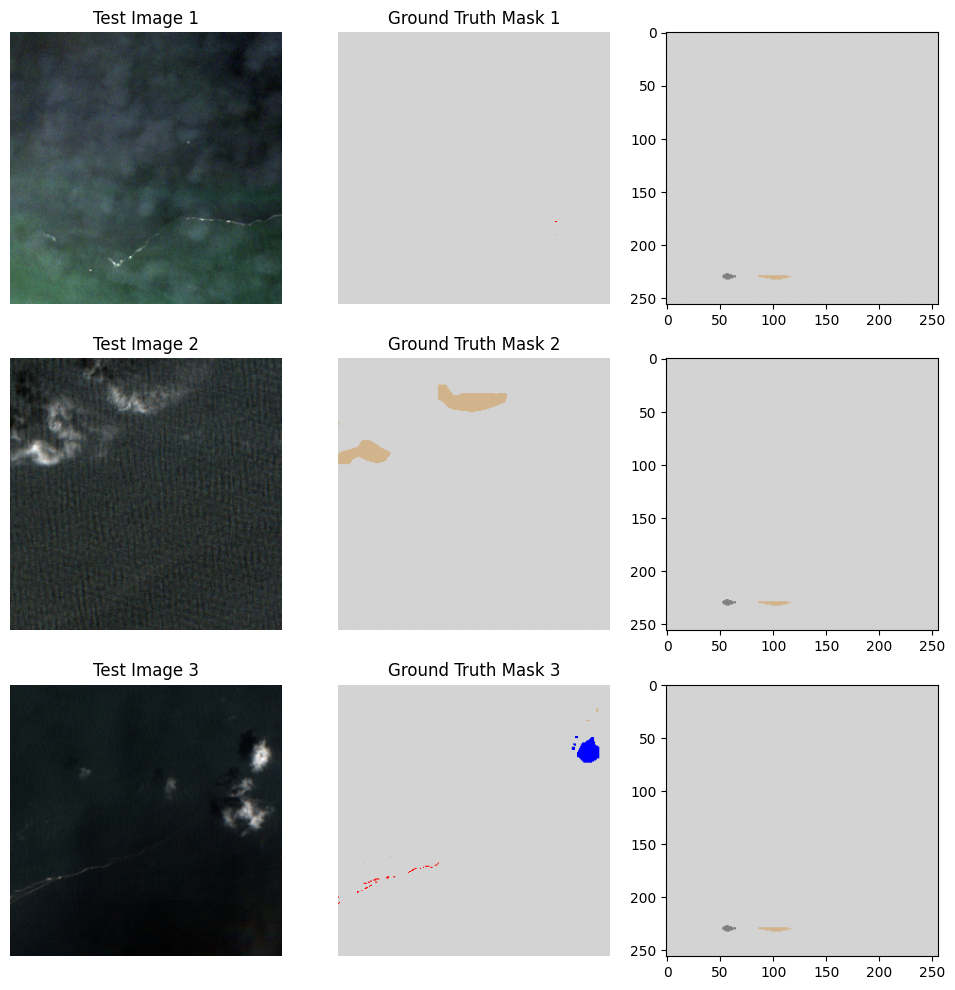

In [ ]:
from matplotlib.colors import ListedColormap

cmap = ListedColormap([
    "#d3d3d3", "#ff0000", "#008000", "#a0522d", "#808080", 
    "#ffffff", "#0000ff", "#d2b48c"  # color_mapping_merged
])

# Load the trained model
model_loaded = load_model("../models/attention_unet_plastic_segmentation_model_resNet.keras", compile=False)

# Get a batch of test images and ground truth masks
sample_img, sample_mask = next(iter(test_dataset)) # Use test_dataset instead of train_dataset
 
# Get model predictions
pred_mask = model_loaded.predict(sample_img)

# Print the shape of the predicted mask
print("Predicted mask shape:", pred_mask.shape)
print("Predicted mask shape:", sample_mask.shape)  # Should be (batch_size, height, width, num_classes)

# Get unique classes in the predicted mask and ground truth mask
unique_classes_pred = np.unique(np.argmax(pred_mask, axis=-1))
unique_classes_true = np.unique(np.argmax(sample_mask, axis=-1))

print("Unique classes in predicted mask:", unique_classes_pred)
print("Unique classes in ground truth mask:", unique_classes_true)

# Number of images to visualize
num_images_to_show = min(3, sample_img.shape[0])  # Show up to 5 images


# Plot test image, ground truth mask, and predicted mask
fig, axes = plt.subplots(num_images_to_show, 3, figsize=(12, 4 * num_images_to_show))

for i in range(num_images_to_show):
    ax1, ax2, ax3 = axes[i]
    
      # Display the test image as RGB with custom channel indices
    rgb_image = np.stack([
        sample_img[i, :, :, 0],  # Red channel (index 1)
        sample_img[i, :, :, 1],  # Green channel (index 2)
        sample_img[i, :, :, 2]   # Blue channel (index 3)
    ], axis=-1)    
    # Display the test image
    ax1.imshow(rgb_image)
    ax1.set_title(f"Test Image {i+1}")
    ax1.axis('off')

    # Display the ground truth mask
    ax2.imshow(np.argmax(sample_mask[i], axis=-1), cmap=cmap)
    ax2.set_title(f"Ground Truth Mask {i+1}")
    ax2.axis('off')

    # Display the predicted mask
    ax3.imshow(np.argmax(pred_mask[i], axis=-1), cmap=cmap)
